<a href="https://colab.research.google.com/github/mdmesa/dstep21_example/blob/main/Copy_of_MonicaMesa_Alvarez_Final_project.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

### **DSTEP21: Final Project**
Monica Mesa-Alvarez

***Traffic Jams Seasonal Patterns in the state of California : Evidence for policy Recommendation***







---

# **Introduction**
•	Traffic congestion affects travel costs, travel time, mobility, accessibility, productivity, and also impacts on the environment such as air pollution and global warming.

•	 Local, state and the federal government are constantly designing policies to address this problem and its consequences.

•	 However, several approaches have failed to correct traffic jams due to the lack of analysis on unintended outcomes. Studying the relationship between traffic jams and, month, and day of the week can help governments understand seasonality patterns.

# **Research Questions**
•	What are the seasonal patterns of traffic jams in a specific state?

•	What are the geographic locations with mayor number of traffic jams in a specific state?

•	What are some policy recommendations that target traffic jams seasonality patterns?

# **Data**
•	The data need for this study was retrieved from data.gov: https://catalog.data.gov/dataset/caltrans-annual-vehicle-delay

•	Caltrans Annual Vehicle Delay

•	This data represents congested freeways organized by county and route, and ranked by Vehicle Hours of Delay where delay is defined as speeds below a certain threshold, in this case, 35 miles per hour. The data also has the corresponding Vehicle Miles Traveled (VMT) for each route.

•	https://pems.dot.ca.gov/



#### **Loading Data**

In [ ]:
# Import geopandas to work with geospatial data
!pip install geopandas

In [ ]:
!pip install jupyter_dash

In [ ]:
!pip install plotly

In [ ]:
# Loading Imports
import numpy as np
import pandas as pd
import geopandas as gp
import matplotlib.pyplot as plt
import statsmodels.formula.api as sm
from statsmodels.tsa.seasonal import seasonal_decompose
import bokeh.plotting as bp
from bokeh.io import output_notebook
import plotly.express as px
from jupyter_dash import JupyterDash
from dash import dcc
from dash import html
from dash.dependencies import Input, Output 
import plotly
import plotly.express as px
from urllib.request import urlopen
import json

/usr/local/lib/python3.7/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


In [ ]:
# Mounting the Google drive to import data
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
# Using a matplotlib "stylesheet"
plt.style.use("seaborn")

# **Data Dictionary**

In [ ]:
#This a data dictinary to describe the variables
dict1 = {
  "County": "Nominal variable that names the various Countiess" ,
  "# Incidents": "Number of Incidents occured during 2017",
  "hours_delay": "Anual number of hours delay during 2017", 
  "# Incidents, Weather": "Total number of weather related incidents that produced traffic delays in some counties of the state of California between 2017 and 2020",
  "# Incidents, Police": "Total number of Police related incidents that produced traffic delays in some counties of the state of California between 2017 and 2020",
  "# Incidents, Hazard": "Total number of Hazardr related incidents that produced traffic delays in some counties of the state of California between 2017 and 2020" ,
  "# Incidents, Accidents": "Total number of road Accidents related incidents that produced traffic delays in some counties of the state of California between 2017 and 2020. It includes all levels of severity: Non-injury, Injury, and Fatality.",
  "# Incidents": "Total number of Incidents, including Weather, Hazard, Police, Accindents and also closure, Advisory and Breakdown related incidents that produced traffic delays in some counties of the state of California between 2017 and 2020"
}
print("County:", dict1["County"])
print("# Incidents:", dict1['# Incidents'])
print("hours_delay:", dict1["hours_delay"])
print("# Incidents, Weather:", dict1["# Incidents, Weather"])
print("# Incidents, Police:", dict1["# Incidents, Police"])
print("# Incidents, Hazard:", dict1["# Incidents, Hazard"])
print("# Incidents, Accidents", dict1["# Incidents, Accidents"])
print("# Incidents:", dict1["# Incidents"])

County: Nominal variable that names the various Countiess
# Incidents: Total number of Incidents, including Weather, Hazard, Police, Accindents and also closure, Advisory and Breakdown related incidents that produced traffic delays in some counties of the state of California between 2017 and 2020
hours_delay: Anual number of hours delay during 2017
# Incidents, Weather: Total number of weather related incidents that produced traffic delays in some counties of the state of California between 2017 and 2020
# Incidents, Police: Total number of Police related incidents that produced traffic delays in some counties of the state of California between 2017 and 2020
# Incidents, Hazard: Total number of Hazardr related incidents that produced traffic delays in some counties of the state of California between 2017 and 2020
# Incidents, Accidents Total number of road Accidents related incidents that produced traffic delays in some counties of the state of California between 2017 and 2020. It incl

In [ ]:
# Loading Caltrans Annual Vehicle Delay 2017 =avd17 data
fname = "/content/drive/MyDrive/destep21/final data/caltrans_annual_vehicle_hours_of_delay_at_35_miles_per_hour___vehicle_miles_traveled_2017.csv"
avdC17 = pd.read_csv(fname, usecols=[2,4,5,6,7,8])
avdC17

,County,Annual Vehicle Hours of Delay (VHD) at 35 miles per hour (mph),Annual Vehicle Miles Traveled (VMT),Number of Incidents,Incidents/ Day,Incidents/ million VMT
0,BUT,7372,59973595,834,2.28,13.91
1,ED,34070,614933130,1741,4.77,2.83
2,NEV,36132,522576590,1781,4.88,3.41
3,PLA,149952,311279662,1029,2.82,3.31
4,PLA,210066,1430481526,4727,12.95,3.30
...,...,...,...,...,...,...
175,ORA,-,149778734,-,0.00,0.00
176,ORA,135890,517167727,330,0.90,0.64
177,ORA,3499,52929771,71,0.19,1.34
178,ORA,2893120,2298279670,7242,19.84,3.15


In [ ]:
# Renaming colummns:
#"hours_delay"="Annual Vehicle Hours of Delay (VHD) at 35 miles per hour (mph)"; "miles_traveled"="Annual Vehicle Miles Traveled (VMT)"

avdC17.rename({
    "Annual Vehicle Hours of Delay (VHD) at 35 miles per hour (mph)": "hours_delay",
     "Annual Vehicle Miles Traveled (VMT)": "miles_traveled",
     " Number of Incidents ": "# Incidents"}, axis=1, inplace=True)

In [ ]:
#Cleaning data
ind=avdC17["hours_delay"]!=" -   "
avdC17=avdC17[ind]
avdC17["hours_delay"]=avdC17["hours_delay"].astype(float)
ind_i=avdC17["# Incidents"]!=" -   "
avdC17=avdC17[ind_i]
avdC17["# Incidents"]=avdC17["# Incidents"].astype(float)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  after removing the cwd from sys.path.


In [ ]:
#Sumary STATISTICS
avdC17.describe()

,hours_delay,miles_traveled,# Incidents,Incidents/ Day,Incidents/ million VMT
count,1.600000e+02,1.600000e+02,160.000000,160.000000,159.000000
mean,9.234690e+05,9.467662e+08,3146.806250,8.621375,3.267484
std,1.656040e+06,1.209840e+09,4065.142448,11.137490,1.961519
min,4.000000e+00,3.299668e+06,1.000000,0.000000,0.030000
25%,3.520250e+04,1.661015e+08,437.000000,1.197500,2.115000
50%,3.400620e+05,5.315285e+08,1639.000000,4.490000,3.150000
75%,1.125357e+06,1.215521e+09,4439.750000,12.165000,4.305000
max,1.375177e+07,8.197790e+09,22495.000000,61.630000,13.910000


As in 2017, in the state of California, there were 9.234690e+05 hours of traffic delay per county. In turn, there were 3,146.8 on average incidents per county. Thus, the average number of incidents per day in each county was 8.6.

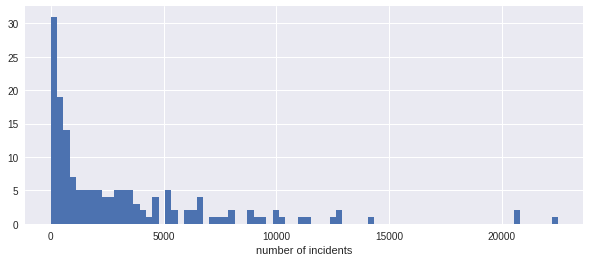

In [ ]:
# -- make a histogram of the incidents values
fig, ax=plt.subplots(figsize=(10,4))
avdC17.hist("# Incidents", bins=80, ax=ax)
ax.set_title("")
ax.set_xlabel("number of incidents")

fig.show()

Figure 1: This figure represent the distribution of the number of incidentes. It dewcribes how are the values of this variable are distributed.

In [ ]:
#Setting Data in Log values to plote a logarithmic distribution 
avdC17["incidents_log"]=np.log10(avdC17["# Incidents"])
incidents_log=avdC17["incidents_log"]

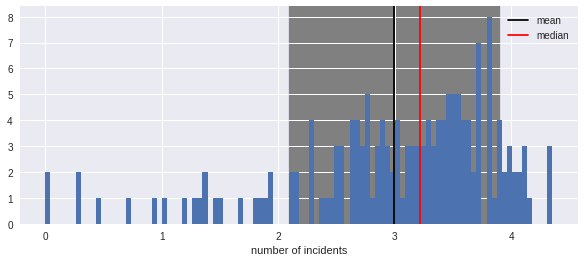

In [ ]:
# -- Make a histogram of the logarithmic values
avg= incidents_log.mean()
med= incidents_log.median()
sig= incidents_log.std()

fig, ax=plt.subplots(figsize=(10,4))
avdC17.hist("incidents_log", bins=100, ax=ax)
ax.set_title("")
ax.set_xlabel("number of incidents")
ax.axvline(avg, color="k", label="mean")
ax.axvline(med, color="r", label="median")
ax.axvspan(avg - sig, avg + sig, color="gray", zorder=0)

ax.legend()
fig.show()

Figure 2: This figure represent the logartithmic distribution of the number of incidentes. It describes how are the values of this variable distributed .As logarithmic values, the distribution of the number of incidents looks more similar to a normal distribution, this is due to the fact that there are days in which the number of incidents was minimun, while there are days in which there were thousands of incidents. 

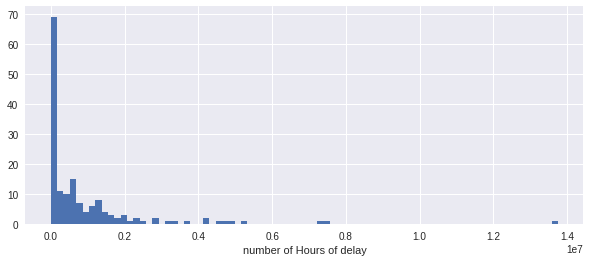

In [ ]:
# -- make a histogram of the hours of delay
fig, ax=plt.subplots(figsize=(10,4))
avdC17.hist("hours_delay", bins=80, ax=ax)
ax.set_title("")
ax.set_xlabel("number of Hours of delay")
fig.show()

Figure 3: This figure represent the distribution of the hours of delay. It dewcribes how are the values of this variable are distributed.

In [ ]:
#Setting the values as logarithmic
avdC17["hours_delay_log"]=np.log10(avdC17["hours_delay"])
hours_delay_log=avdC17["hours_delay_log"]

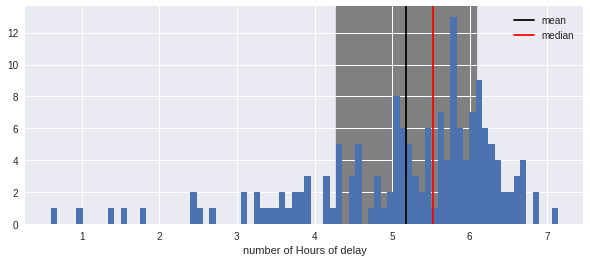

In [ ]:
# -- make a histogram of the hour delay
avg1= hours_delay_log.mean()
med1= hours_delay_log.median()
sig1= hours_delay_log.std()

fig, ax=plt.subplots(figsize=(10,4))
avdC17.hist("hours_delay_log", bins=80, ax=ax)
ax.set_title("")
ax.set_xlabel("number of Hours of delay")
ax.axvline(avg1, color="k", label="mean")
ax.axvline(med1, color="r", label="median")
ax.axvspan(avg1 - sig, avg1 + sig, color="gray", zorder=0)
ax.legend()
fig.show()


Figure 4: This figure represent the logartithmic distribution of the number of hours of delays. It describes how are the values of this variable distributed. As logarithmic values, the distrbution of the number of hours of delay incidents looks more similar to a normal distribution, this is due to the fact that there are days in which the number of hours of delay was minimun, while there are days in which there were very long delays. 

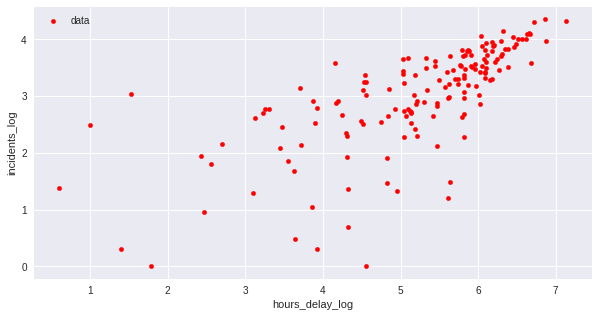

In [ ]:
#PLot of correlation between the two variables
fig, ax =plt.subplots(figsize=(10,5))
avdC17.plot("hours_delay_log","incidents_log", kind="scatter", color="r", label="data", ax=ax)

Figure 5: This figure shows the correlation between hours of delay and number of incidents. The graph shows a paterns which corroborates the existance of a correlation between this two variables.

In [ ]:
#Setting the regression model
model =sm.ols("hours_delay_log ~ incidents_log", data=avdC17)
result =model.fit()
print(result.summary())

                            OLS Regression Results                            
Dep. Variable:        hours_delay_log   R-squared:                       0.497
Model:                            OLS   Adj. R-squared:                  0.494
Method:                 Least Squares   F-statistic:                     156.1
Date:                Sat, 11 Dec 2021   Prob (F-statistic):           2.41e-25
Time:                        06:34:52   Log-Likelihood:                -204.11
No. Observations:                 160   AIC:                             412.2
Df Residuals:                     158   BIC:                             418.4
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                    coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------
Intercept         2.3238      0.239      9.720

*Linear Regresion*

Acording to the data analyzed there is a relationship between the number of road incidents and the hours of traffic delay in some counties witin the state of California, S= 0.9547 R= 0.497.Since this regression is a log-log analisys, it means that on percent change in the number of incidents, leads to a 0.9547 percent change in the hours of traffic delay. 

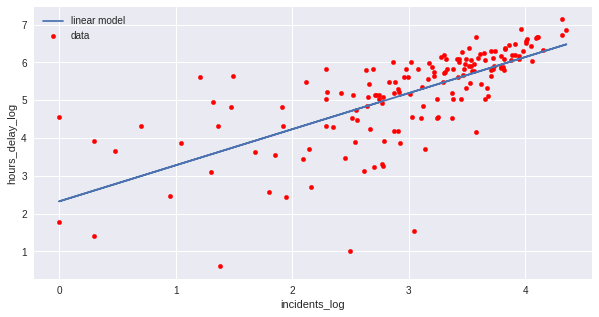

In [ ]:
#PLot the linear model
pred=result.predict(avdC17)

fig, ax =plt.subplots(figsize=(10,5))
avdC17.plot("incidents_log","hours_delay_log", kind="scatter", color="r", label="data", ax=ax)
ax.plot(avdC17["incidents_log"], pred, label="linear model")
ax.legend()
fig.show()

Figure 6: This figure shows the correlation between hours of delay and number of incidents and the linear model. The graph shows how well the liner model explans, fits, the correlation between the two variables.

## **Geospatial Analysis**

In [ ]:
# Load the geo dataset
ccname = "/content/drive/MyDrive/destep21/final data/California_County_Boundaries/cnty19_1.shx"
ccshps = gp.read_file(ccname)
ccshps

,OBJECTID,COUNTY_NAM,COUNTY_ABB,COUNTY_NUM,COUNTY_COD,COUNTY_FIP,ISLAND,GlobalID,SHAPE_Leng,SHAPE_Area,geometry
0,1,Alameda,ALA,1,01,001,None,{E6F92268-D2DD-4CFB-8B79-5B4B2F07C559},308998.650975,-3.402787e+09,"POLYGON ((-13611173.233 4566017.932, -13611061..."
1,2,Alpine,ALP,2,02,003,None,{870479B2-480A-494B-8352-AD60578839C1},274888.492662,-3.146939e+09,"POLYGON ((-13312326.921 4680816.110, -13312311..."
2,3,Amador,AMA,3,03,005,None,{4F45B3A6-BE10-461C-8945-6B2AAA7119F6},361708.438649,-2.562635e+09,"POLYGON ((-13366405.546 4679183.529, -13366408..."
3,4,Butte,BUT,4,04,007,None,{44FBA680-AECC-4E04-A499-29D69AFFBD4A},526547.113134,-7.339348e+09,"POLYGON ((-13478186.664 4807593.081, -13478502..."
4,5,Calaveras,CAL,5,05,009,None,{D11EF739-4A1E-414E-BFD1-E7DCD56CD61E},370637.579039,-4.351069e+09,"POLYGON ((-13360333.217 4641182.754, -13360329..."
...,...,...,...,...,...,...,...,...,...,...,...
64,65,Ventura,VEN,56,56,111,Channel Islands,{86C2171F-D249-45A0-AC0C-40A4E6CB82E2},11880.900111,-8.750094e+05,"POLYGON ((-13289471.165 4030300.859, -13289471..."
65,66,Ventura,VEN,56,56,111,Channel Islands,{71E2D2AD-A83C-4F5D-BC3B-B7AD9B12F57B},14258.526448,-2.595855e+06,"POLYGON ((-13295199.812 4030950.945, -13295194..."
66,67,Ventura,VEN,56,56,111,Channel Islands,{D90412B1-C6AF-4437-94D9-48DC3A13A64D},7967.030170,-6.082082e+05,"POLYGON ((-13287570.139 4031059.291, -13287569..."
67,68,Los Angeles,LOS,19,19,037,Channel Islands,{3CB33DC3-E564-4BBF-8528-866600A1F9E4},135274.199619,-2.076580e+08,"POLYGON ((-13195691.433 3892660.579, -13195682..."


In [ ]:
# -- note the coordinates
ccshps.crs

<Projected CRS: EPSG:3857>
Name: WGS 84 / Pseudo-Mercator
Axis Info [cartesian]:
- X[east]: Easting (metre)
- Y[north]: Northing (metre)
Area of Use:
- name: World between 85.06°S and 85.06°N.
- bounds: (-180.0, -85.06, 180.0, 85.06)
Coordinate Operation:
- name: Popular Visualisation Pseudo-Mercator
- method: Popular Visualisation Pseudo Mercator
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

In [ ]:
#MERGE THE GEO DATASET AND THE DATAFRAME
avdC17_geo=ccshps.merge(avdC17, left_on="COUNTY_ABB", right_on="County")

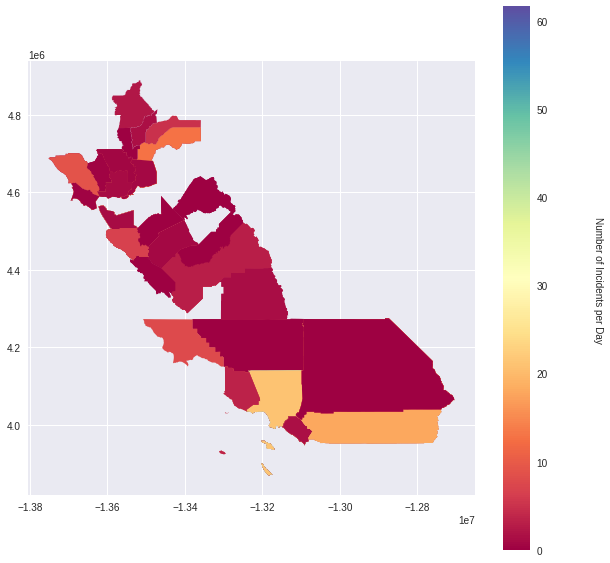

In [ ]:
# -- Choroplot "Number of Incidents per Day"
fig, ax=plt.subplots(figsize=(10,10))
avdC17_geo.plot("Incidents/ Day", legend=True, cmap="Spectral", ax=ax)
fig.text(0.91, 0.5, "Number of Incidents per Day", rotation=-90, va="center" )
fig.show()

Figure 7: THis is a choroplot of the "Number of Incidents per Day". It ilustrates where are located the counties that have a higer a lower "Number of Incidents per Day".

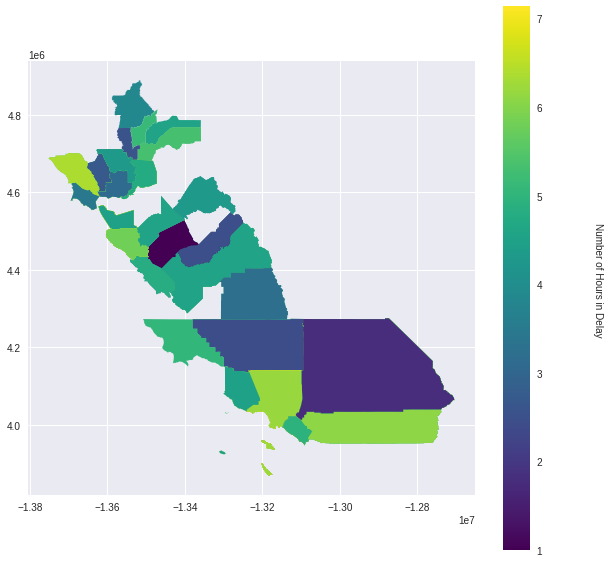

In [ ]:
# -- Choroplot of the Number of Hours in Delay
fig, ax=plt.subplots(figsize=(10,10))
avdC17_geo.plot("hours_delay_log", legend=True, cmap="viridis", ax=ax)
fig.text(0.91, 0.5, "Number of Hours in Delay", rotation=-90, va="center" )
fig.show()

Figure 8: This is a choroplot of the Number of Hours in Delay. It ilustrates where are located the counties that have a higer a lower Number of Hours in Delay.

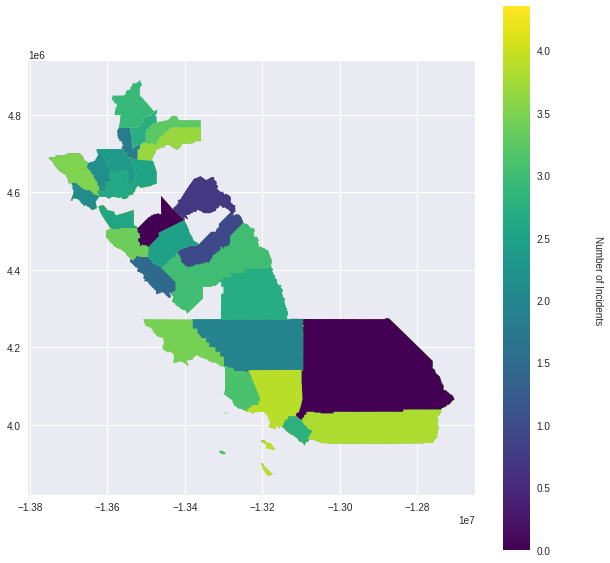

In [ ]:
# -- Choroplot of the Number of Incidents
fig, ax=plt.subplots(figsize=(10,10))
avdC17_geo.plot("incidents_log", legend=True, cmap="viridis", ax=ax)
fig.text(0.91, 0.5, "Number of Incidents", rotation=-90, va="center" )
fig.show()

Figure 9: This is a choroplot of the Number of Number of Incidents. It ilustrates where are located the counties that have a higer a lower Number of Incidents.

## **TIMESERIES ANALYSIS**

In [ ]:
#Caltrans incidents perday time series,  all incidents 01-01-2017-0 incpd=incidents per day
dname = "/content/drive/MyDrive/destep21/final data/pems_output_ts.xlsx"
incpd = pd.read_excel(dname)
incpd["Time"].astype("datetime64[ns]")
incpd_ts=incpd.set_index('Time')


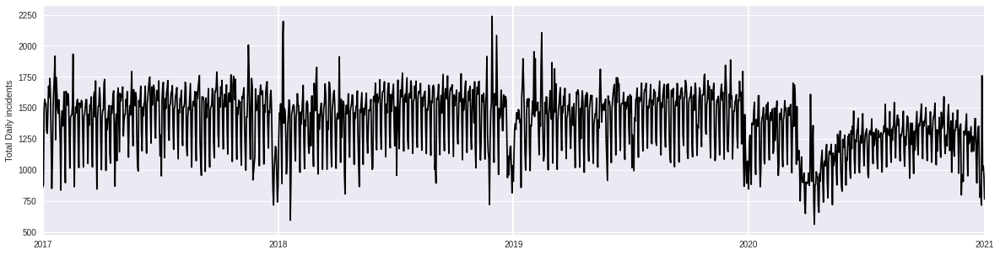

In [ ]:
# Time series of the total number 
ax=incpd_ts.plot(y="# Incidents", color="k", use_index=True, figsize=(20,5), legend=False )
ax.grid(axis="x", which="major", lw=2)
xlab = ax.set_xlabel("")
ylab = ax.set_ylabel("Total Daily incidents")

Figure 10: Time series of the total number of incidents between 2017 and 2020 in some counties of the state of California. It shows the temporal distribution of the number of incidents. 

In [ ]:
#Total number of incidentes between 2017 and 2020
inc1720_total=incpd_ts["# Incidents"].sum()

In [ ]:
# Finding the day of the week with more incidents
incpd_DW= pd.DatetimeIndex(incpd["Time"]).day_name()
incpd["Day of the week"]=incpd_DW
incpd.groupby("Day of the week").sum().sort_values(by="# Incidents", ascending=False )

,# Incidents
Day of the week,
Friday,324354
Thursday,316664
Wednesday,308389
Tuesday,301553
Monday,294919
Saturday,255837
Sunday,221500


The Friday was the day of the week in which there were the higer number of incidentes between 2017 and 2020, with a total of 324,354.

In [ ]:
# Finding the month of the year with more incidents
incpd_MOY= pd.DatetimeIndex(incpd["Time"]).month_name()
incpd["Month of the year"]=incpd_MOY
incpd.groupby("Month of the year").sum().sort_values(by="# Incidents", ascending=False)

,# Incidents
Month of the year,
October,180537
August,178724
July,174293
June,171243
March,169871
January,169776
September,169341
November,167205
May,166201


October was the month of the year with a higher number of incidents with a total of 180,537 incidents.

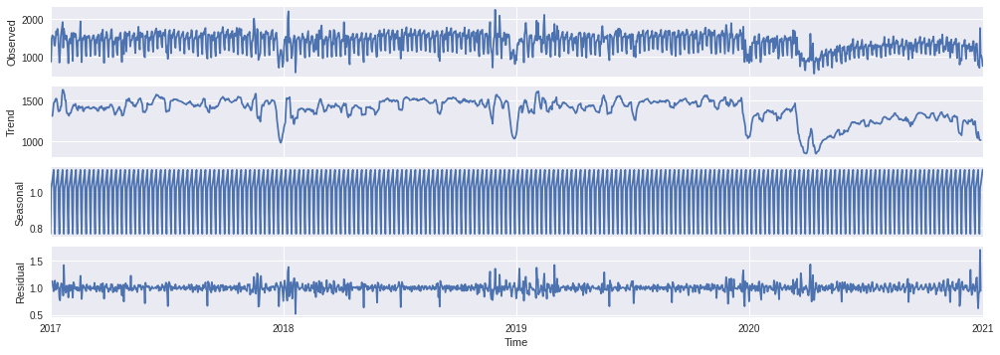

In [ ]:
#Seasonal Descomposition
incpd_ts.index = pd.to_datetime(incpd_ts.index)
incpd_ts_re= incpd_ts.resample("1D").interpolate(method="linear")
res_mul = seasonal_decompose(incpd_ts_re["# Incidents"], model="mul")
fig=res_mul.plot()
fig.set_size_inches(15, 5)

Figure 11: This figure shows the seasonal descomposition of the total number on incidents between 2017 and 2020. It ilustrates, trends, seasonality, and the residual distributions. 

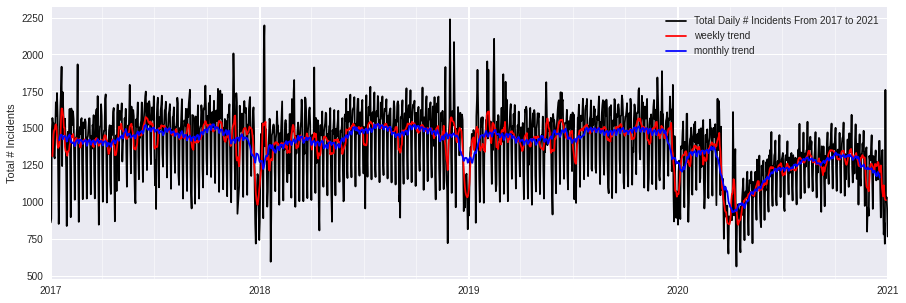

In [ ]:
# Montly and weekly trends
incpd_07 =incpd_ts_re.rolling(7, center=True).mean()
incpd_30 =incpd_ts_re.rolling(30, center=True).mean()
fig, ax = plt.subplots( figsize=(15, 5))
incpd_ts_re.plot(y="# Incidents", color="k", label="Total Daily # Incidents From 2017 to 2021",  ax=ax)
incpd_07.plot(y="# Incidents", color="red", label="weekly trend",  ax=ax)
incpd_30.plot(y="# Incidents", color="blue", label="monthly trend",  ax=ax)
ax.grid(axis="x", which="major", lw=2)
ax.grid(axis="x", which="minor", lw=0.5)
ax.set_xlabel("")
ax.set_ylabel("Total # Incidents")
fig.show()

Figure 12: This graph shows the weekly and monthly trends of the total number of incidents between 2017 and 2020. It shows the long and short term trends of this time series.

Text(0, 0.5, 'Residual # Incidents')

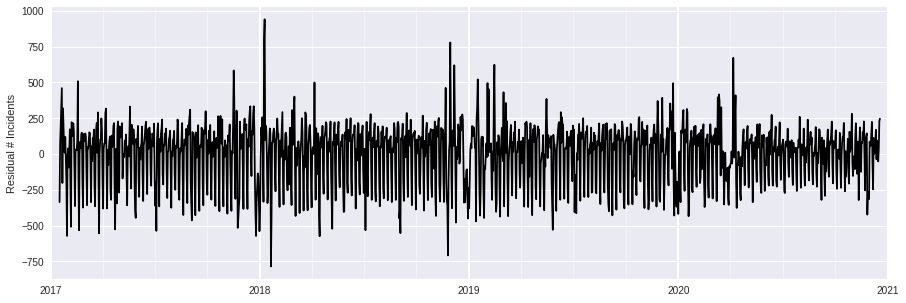

In [ ]:
#Periodicity
incpd_short = incpd_ts_re - incpd_30
ax = incpd_short.plot(y="# Incidents", color="k", legend=False, figsize=(15, 5))
ax.grid(axis="x", which="major", lw=2)
ax.grid(axis="x", which="minor", lw=0.5)
ax.set_xlabel("")
ax.set_ylabel("Residual # Incidents")

Figure 13: This figures is a time series of the residual of the total number of incidents. It ilustrates the temporal patern withpith the long term trends.

(1.0, 28.0)

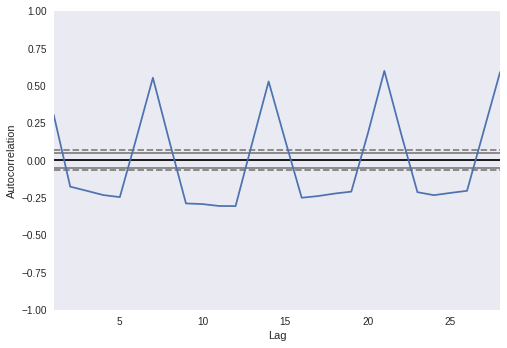

In [ ]:
ax=pd.plotting.autocorrelation_plot(incpd_short["# Incidents"].dropna())
ax.set_xlim(1,28)

Figure 14: This is the autocorrelation plot of the total number of incidentes. It ilustartes the structure of the data, according to this graph there is weekly seasonality in this timeseries because there is a peak every 7 lags. 

In [ ]:
#Caltrans weather incidents perday time series,  all incidents 01-01-2017-0 incpd=incidents per day
wname = "/content/drive/MyDrive/destep21/final data/pems_output_weather.xlsx"
weather_incpd = pd.read_excel(wname)
weather_incpd_ts=weather_incpd.set_index('Time')

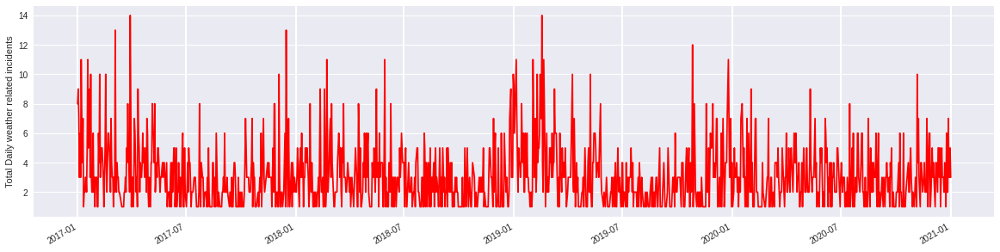

In [ ]:
# Time series of the total number
ax=weather_incpd_ts.plot(y="# Incidents", color="r", use_index=True, figsize=(20,5), legend=False )
ax.grid(axis="x", which="major", lw=2)
xlab = ax.set_xlabel("")
ylab = ax.set_ylabel("Total Daily weather related incidents")

Figure 15: Time series of the number of incidents due to weather between 2017 and 2020 in some counties of the state of California. It shows the temporal distribution of the number of weather incidents. 

In [ ]:
Winc1720_total=weather_incpd_ts["# Incidents"].sum()

In [ ]:
#Finding the Day of the week whit more weather related incidents 
weather_incpd_DW= pd.DatetimeIndex(weather_incpd["Time"]).day_name()
weather_incpd["Day of the week"]=weather_incpd_DW
weather_incpd.groupby("Day of the week").sum().sort_values(by="# Incidents", ascending=False )

,# Incidents
Day of the week,
Thursday,652
Wednesday,608
Monday,575
Tuesday,567
Sunday,560
Saturday,542
Friday,520


Thursday was the day of the week in which there were the higer number of weather incidentes between 2017 and 2020, with a total of 652.

In [ ]:
#Finding the month of the year with more weather incidents
weather_incpd_MOY= pd.DatetimeIndex(weather_incpd["Time"]).month_name()
weather_incpd["Month of the year"]=weather_incpd_MOY
weather_incpd.groupby("Month of the year").sum().sort_values(by="# Incidents", ascending=False)

,# Incidents
Month of the year,
January,459
February,424
May,403
March,397
December,386
April,351
November,306
June,282
July,277


January is the month of the year with more weather incidents with a total of 459

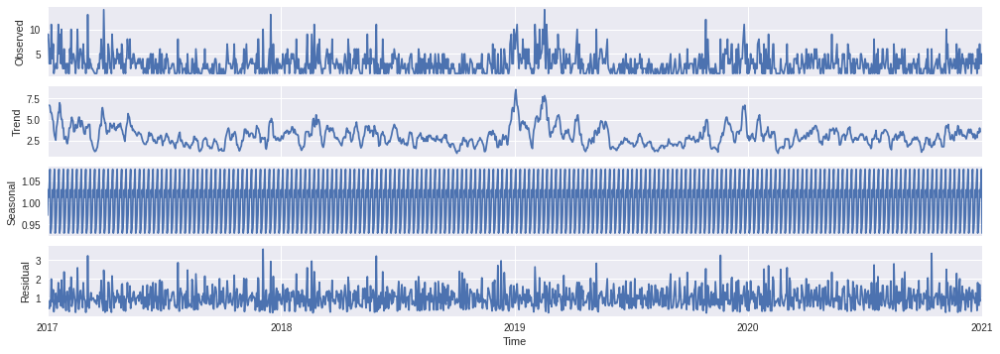

In [ ]:
#Seasonal Descomposition
weather_incpd_ts.index = pd.to_datetime(weather_incpd_ts.index)
weather_incpd_ts_re= weather_incpd_ts.resample("1D").interpolate(method="linear")
res_mul = seasonal_decompose(weather_incpd_ts_re["# Incidents"], model="mul")
fig=res_mul.plot()
fig.set_size_inches(15, 5)

Figure 16: This figure shows the seasonal descomposition of the total number of weather incidents between 2017 and 2020. It ilustrates, trends, seasonality, and the residual distributions.

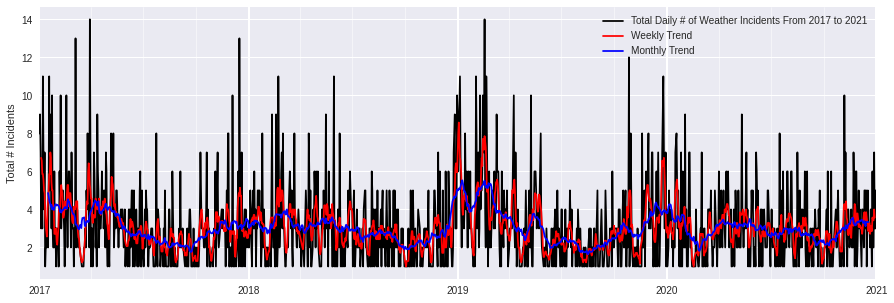

In [ ]:
weather_incpd_07 =weather_incpd_ts_re.rolling(7, center=True).mean()
weather_incpd_30 =weather_incpd_ts_re.rolling(30, center=True).mean()
fig, ax = plt.subplots( figsize=(15, 5))
weather_incpd_ts_re.plot(y="# Incidents", color="k", label="Total Daily # of Weather Incidents From 2017 to 2021",  ax=ax)
weather_incpd_07.plot(y="# Incidents", color="red", label="Weekly Trend",  ax=ax)
weather_incpd_30.plot(y="# Incidents", color="blue", label="Monthly Trend",  ax=ax)
ax.grid(axis="x", which="major", lw=2)
ax.grid(axis="x", which="minor", lw=0.5)
ax.set_xlabel("")
ax.set_ylabel("Total # Incidents")
fig.show()

Figure 17: This graph shows the weekly and monthly trends of the total number of weather incidents between 2017 and 2020. It shows the long and short term trends of this time series.

Text(0, 0.5, 'Residual # of weather related Incidents')

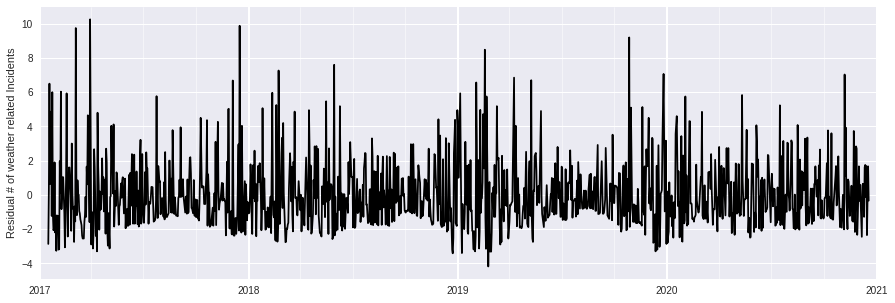

In [ ]:
#Periodicity
weather_incpd_short = weather_incpd_ts_re - weather_incpd_30
ax = weather_incpd_short.plot(y="# Incidents", color="k", legend=False, figsize=(15, 5))
ax.grid(axis="x", which="major", lw=2)
ax.grid(axis="x", which="minor", lw=0.5)
ax.set_xlabel("")
ax.set_ylabel("Residual # of weather related Incidents")

Figure 18: This figures is a time series of the residual of the total number of weather incidents. It ilustrates the temporal patern without the long term trends.

(1.0, 28.0)

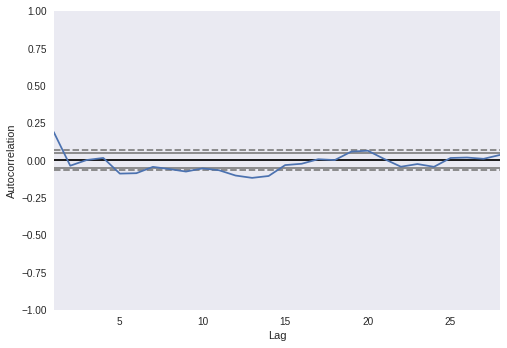

In [ ]:
ax=pd.plotting.autocorrelation_plot(weather_incpd_short["# Incidents"].dropna())
ax.set_xlim(1,28)

Figure 19: This is the autocorrelation plot of the total number of weather incidentes. It ilustartes the structure of the data, according to this graph there is not weekly seasonality in this timeseries because there is a not a peak pettern. This resoult makes total sense because the events asosiated with the weater are ramdon events.

In [ ]:
#Caltrans incidents perday time series,  all incidents 01-01-2017-0 incpd=incidents per day
pname = "/content/drive/MyDrive/destep21/final data/pems_output_Police.xlsx"
police_incpd = pd.read_excel(pname)
police_incpd_ts=police_incpd.set_index('Time')

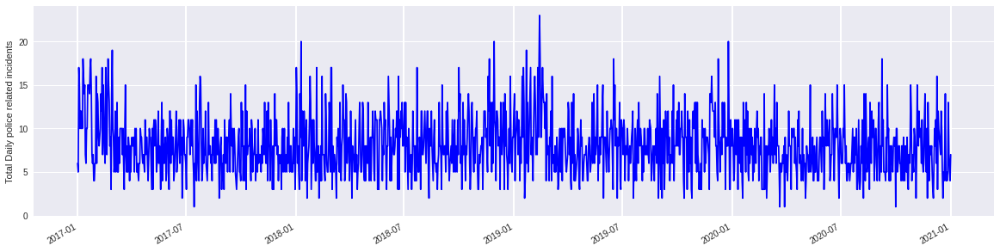

In [ ]:
# Time series police
ax=police_incpd_ts.plot(y="# Incidents", color="b", use_index=True, figsize=(20,5), legend=False )
ax.grid(axis="x", which="major", lw=2)
xlab = ax.set_xlabel("")
ylab = ax.set_ylabel("Total Daily police related incidents")

Figure 20: Time series of the number of incidents due to police between 2017 and 2020 in some counties of the state of California. It shows the temporal distribution of the number of police incidents.

In [ ]:
#Calculate the total
Pinc1720_total=police_incpd_ts["# Incidents"].sum()

In [ ]:
# Finding the day of the week with more incidents
police_incpd_DW= pd.DatetimeIndex(police_incpd["Time"]).day_name()
police_incpd["Day of the week"]=police_incpd_DW
police_incpd.groupby("Day of the week").sum().sort_values(by="# Incidents", ascending=False )

,# Incidents
Day of the week,
Monday,1953
Wednesday,1917
Tuesday,1880
Thursday,1781
Friday,1599
Sunday,1388
Saturday,1334


Monday was the day with more police incidents, with a total of 1,953.

In [ ]:
#Finding the month of the year with more incidents
police_incpd_MOY= pd.DatetimeIndex(police_incpd["Time"]).month_name()
police_incpd["Month of the year"]=police_incpd_MOY
police_incpd.groupby("Month of the year").sum().sort_values(by="# Incidents", ascending=False)

,# Incidents
Month of the year,
January,1176
February,1056
November,1021
June,1010
October,995
December,989
May,956
July,955
March,955


January was the month of the year with more incidents 1,176

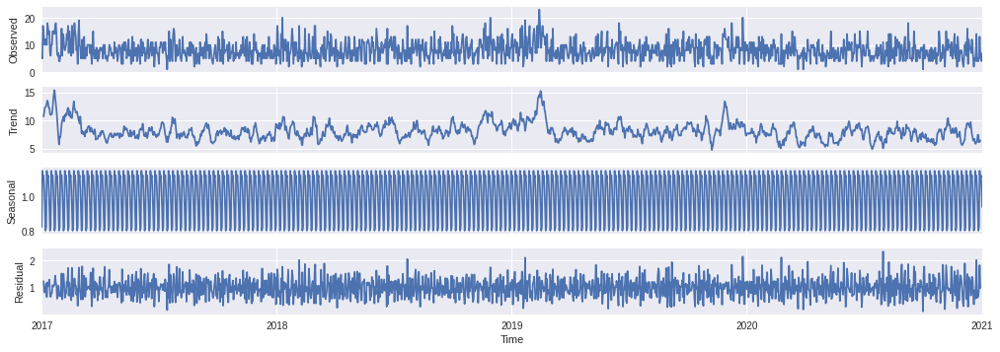

In [ ]:
#Seasonal Descomposition
police_incpd_ts.index = pd.to_datetime(police_incpd_ts.index)
#Graph
police_incpd_ts_re= police_incpd_ts.resample("1D").interpolate(method="linear")
res_mul = seasonal_decompose(police_incpd_ts_re["# Incidents"], model="mul")
fig=res_mul.plot()
fig.set_size_inches(15, 5)

Figure 21: This figure shows the seasonal descomposition of the total number of police incidents between 2017 and 2020. It ilustrates, trends, seasonality, and the residual distributions.

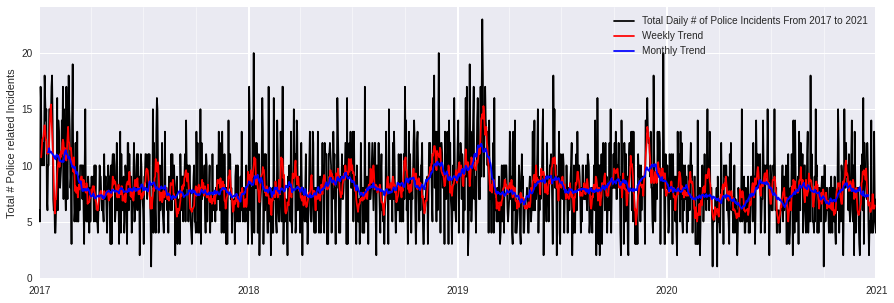

In [ ]:
#Weekly and monthly trends
police_incpd_07 =police_incpd_ts_re.rolling(7, center=True).mean()
police_incpd_30 =police_incpd_ts_re.rolling(30, center=True).mean()
fig, ax = plt.subplots( figsize=(15, 5))
police_incpd_ts_re.plot(y="# Incidents", color="k", label="Total Daily # of Police Incidents From 2017 to 2021",  ax=ax)
police_incpd_07.plot(y="# Incidents", color="red", label="Weekly Trend",  ax=ax)
police_incpd_30.plot(y="# Incidents", color="blue", label="Monthly Trend",  ax=ax)
ax.grid(axis="x", which="major", lw=2)
ax.grid(axis="x", which="minor", lw=0.5)
ax.set_xlabel("")
ax.set_ylabel("Total # Police related Incidents")
fig.show()

Figure 22: This graph shows the weekly and monthly trends of the total number of police incidents between 2017 and 2020. It shows the long and short term trends of this time series.

Text(0, 0.5, 'Residual # of police related Incidents')

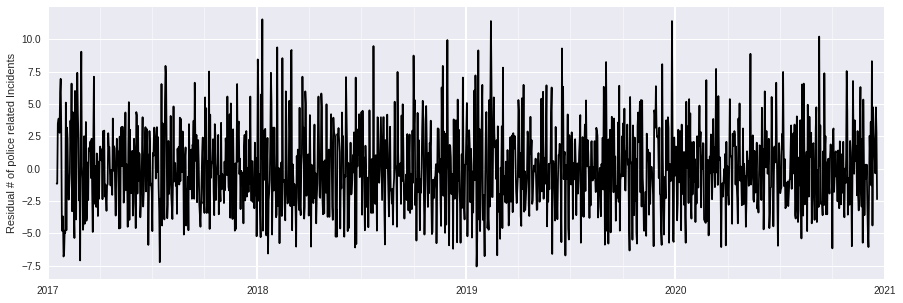

In [ ]:
#Periodicity
police_incpd_short = police_incpd_ts_re - police_incpd_30
ax = police_incpd_short.plot(y="# Incidents", color="k", legend=False, figsize=(15, 5))
ax.grid(axis="x", which="major", lw=2)
ax.grid(axis="x", which="minor", lw=0.5)
ax.set_xlabel("")
ax.set_ylabel("Residual # of police related Incidents")

Figure 23: This figures is a time series of the residual of the total number of police incidents. It ilustrates the temporal patern without the long term trends.

(1.0, 28.0)

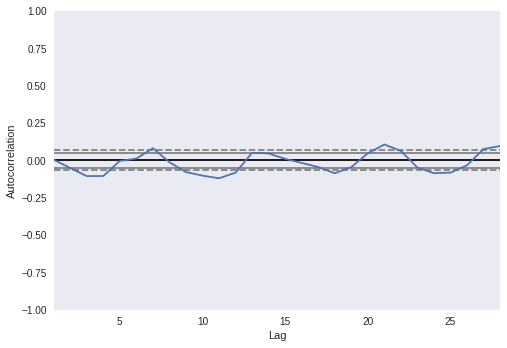

In [ ]:
#Autocorrelation plot
ax=pd.plotting.autocorrelation_plot(police_incpd_short["# Incidents"].dropna())
ax.set_xlim(1,28)

Figure 24: This is the autocorrelation plot of the total number of hazard incidentes. It ilustartes the structure of the data, according to this graph there is a very weak weekly seasonality in this timeseries because there is a slow peak every 7 lags.

In [ ]:
#Caltrans incidents perday time series,  all incidents 01-01-2017-0 incpd=incidents per day
hname = "/content/drive/MyDrive/destep21/final data/pems_output hazard.xlsx"
hazard_incpd = pd.read_excel(hname)
hazard_incpd_ts=hazard_incpd.set_index('Time')

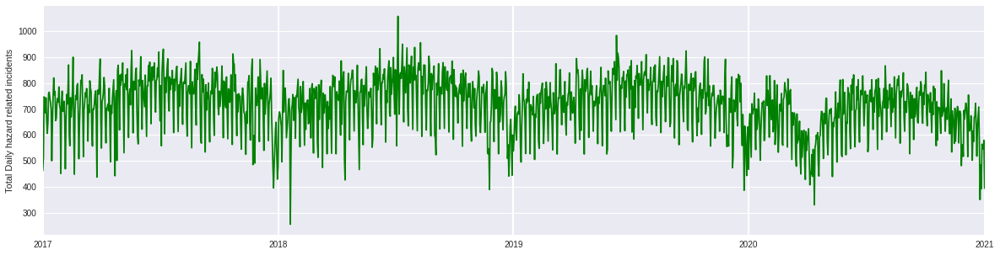

In [ ]:
#Timeseries hazard
ax=hazard_incpd_ts.plot(y="# Incidents", color="green", use_index=True, figsize=(20,5), legend=False )
ax.grid(axis="x", which="major", lw=2)
xlab = ax.set_xlabel("")
ylab = ax.set_ylabel("Total Daily hazard related incidents")

Figure 25: Time series of the number of incidents due to hazard between 2017 and 2020 in some counties of the state of California. It shows the temporal distribution of the number of hazard incidents.

In [ ]:
#Calculate the total hazard
Hinc1720_total=hazard_incpd_ts["# Incidents"].sum()

In [ ]:
#Finding the day of the week with more hazxard incidents
hazard_incpd_DW= pd.DatetimeIndex(hazard_incpd["Time"]).day_name()
hazard_incpd["Day of the week"]=hazard_incpd_DW
hazard_incpd.groupby("Day of the week").sum().sort_values(by="# Incidents", ascending=False )


,# Incidents
Day of the week,
Friday,166172
Thursday,159349
Wednesday,156140
Monday,153862
Tuesday,152627
Saturday,139780
Sunday,119232


Friday was the day of the week with more hazard incidents 166,172

In [ ]:
#Finding month of the year with more hazard incidents
hazard_incpd_MOY= pd.DatetimeIndex(hazard_incpd["Time"]).month_name()
hazard_incpd["Month of the year"]=hazard_incpd_MOY
hazard_incpd.groupby("Month of the year").sum().sort_values(by="# Incidents", ascending=False)

,# Incidents
Month of the year,
August,95610
July,95464
June,92459
October,91623
September,89293
May,89224
March,85202
January,83973
November,82501


August is the mont of the year with more hazard incidents with  95,610

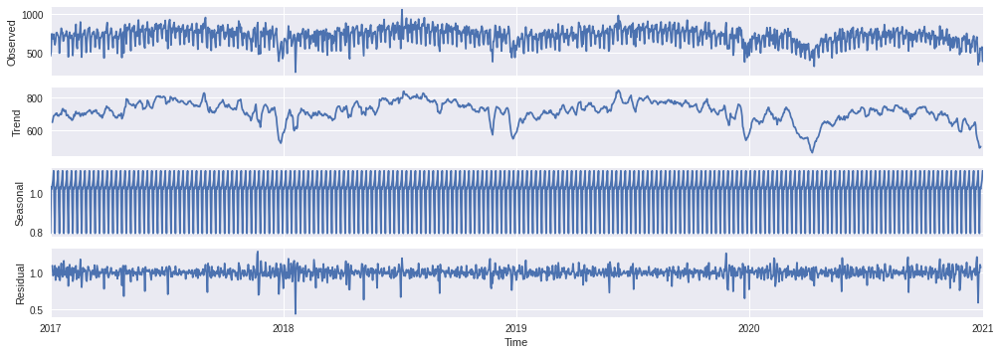

In [ ]:
#Seasonal Descomposition
hazard_incpd_ts.index = pd.to_datetime(hazard_incpd_ts.index)
#Graph
hazard_incpd_ts_re= hazard_incpd_ts.resample("1D").interpolate(method="linear")
res_mul = seasonal_decompose(hazard_incpd_ts_re["# Incidents"], model="mul")
fig=res_mul.plot()
fig.set_size_inches(15, 5)

Figure 26: This figure shows the seasonal descomposition of the total number of hazard incidents between 2017 and 2020. It ilustrates, trends, seasonality, and the residual distributions.

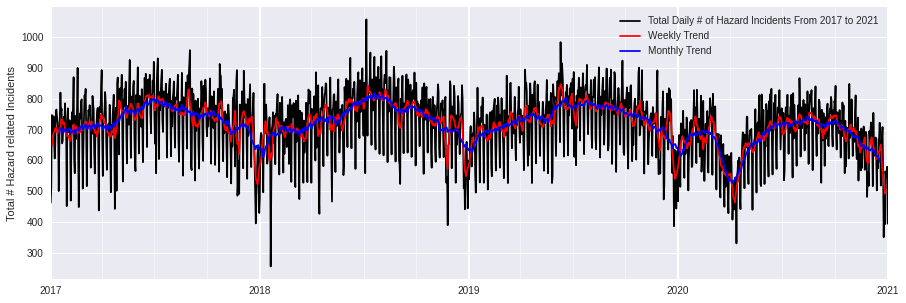

In [ ]:
# Hazard weekly and montly trends
hazard_incpd_07 =hazard_incpd_ts_re.rolling(7, center=True).mean()
hazard_incpd_30 =hazard_incpd_ts_re.rolling(30, center=True).mean()
fig, ax = plt.subplots( figsize=(15, 5))
hazard_incpd_ts_re.plot(y="# Incidents", color="k", label="Total Daily # of Hazard Incidents From 2017 to 2021",  ax=ax)
hazard_incpd_07.plot(y="# Incidents", color="red", label="Weekly Trend",  ax=ax)
hazard_incpd_30.plot(y="# Incidents", color="blue", label="Monthly Trend",  ax=ax)
ax.grid(axis="x", which="major", lw=2)
ax.grid(axis="x", which="minor", lw=0.5)
ax.set_xlabel("")
ax.set_ylabel("Total # Hazard related Incidents")
fig.show()

Figure 27: This graph shows the weekly and monthly trends of the total number of hazard incidents between 2017 and 2020. It shows the long and short term trends of this time series.

Text(0, 0.5, 'Residual # of hazard related Incidents')

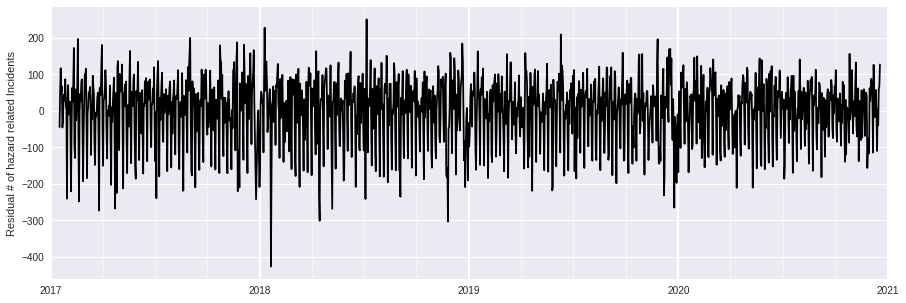

In [ ]:
#Periodicity
hazard_incpd_short = hazard_incpd_ts_re - hazard_incpd_30
ax =hazard_incpd_short.plot(y="# Incidents", color="k", legend=False, figsize=(15, 5))
ax.grid(axis="x", which="major", lw=2)
ax.grid(axis="x", which="minor", lw=0.5)
ax.set_xlabel("")
ax.set_ylabel("Residual # of hazard related Incidents")

Figure 28: This figures is a time series of the residual of the total number of hazard incidents. It ilustrates the temporal patern withpith the long term trends.

(1.0, 28.0)

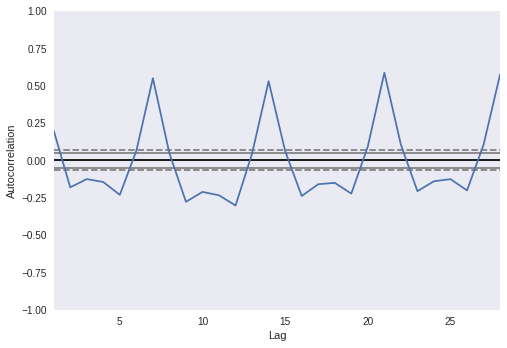

In [ ]:
#Autocorelation plot for hazard incidents
ax=pd.plotting.autocorrelation_plot(hazard_incpd_short["# Incidents"].dropna())
ax.set_xlim(1,28)

Figure 29: This is the autocorrelation plot of the total number of hazard incidentes. It ilustartes the structure of the data, according to this graph there is weekly seasonality in this timeseries because there is a peak every 7 lags.

In [ ]:
#Caltrans incidents perday time series,  all incidents 01-01-2017-0 incpd=incidents per day
aname = "/content/drive/MyDrive/destep21/final data/pems_output_Accidents.xlsx"
accidents_incpd = pd.read_excel(aname)
accidents_incpd_ts=accidents_incpd.set_index('Time')

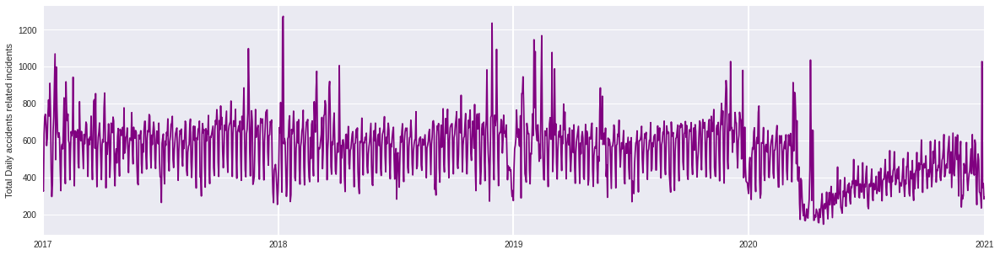

In [ ]:
#Time series Accidents
ax=accidents_incpd_ts.plot(y="# Incidents", color="purple", use_index=True, figsize=(20,5), legend=False )
ax.grid(axis="x", which="major", lw=2)
xlab = ax.set_xlabel("")
ylab = ax.set_ylabel("Total Daily accidents related incidents")

Figure 30: Time series of the number of incidents due to accidents between 2017 and 2020 in some counties of the state of California. It shows the temporal distribution of the number of accidents incidents.

In [ ]:
#Total Accidents
Ainc1720_total=accidents_incpd_ts["# Incidents"].sum()

In [ ]:
# Finding day of the week with more accident incidents
accidents_incpd_DW= pd.DatetimeIndex(accidents_incpd["Time"]).day_name()
accidents_incpd["Day of the week"]=accidents_incpd_DW
accidents_incpd.groupby("Day of the week").sum().sort_values(by="# Incidents", ascending=False )

,# Incidents
Day of the week,
Friday,133642
Thursday,128039
Wednesday,123625
Tuesday,120522
Monday,113551
Saturday,95723
Sunday,81554


Friday is the day of the week with more accidents incidents with a total of 133,642

In [ ]:
#Finding month of the year with more accident incidents
accidents_incpd_MOY= pd.DatetimeIndex(accidents_incpd["Time"]).month_name()
accidents_incpd["Month of the year"]=accidents_incpd_MOY
accidents_incpd.groupby("Month of the year").sum().sort_values(by="# Incidents", ascending=False)

,# Incidents
Month of the year,
January,72918
October,71649
March,71552
November,70359
December,67541
February,67445
August,66072
September,64307
June,62106


January is the month with more accident incidents 72,918

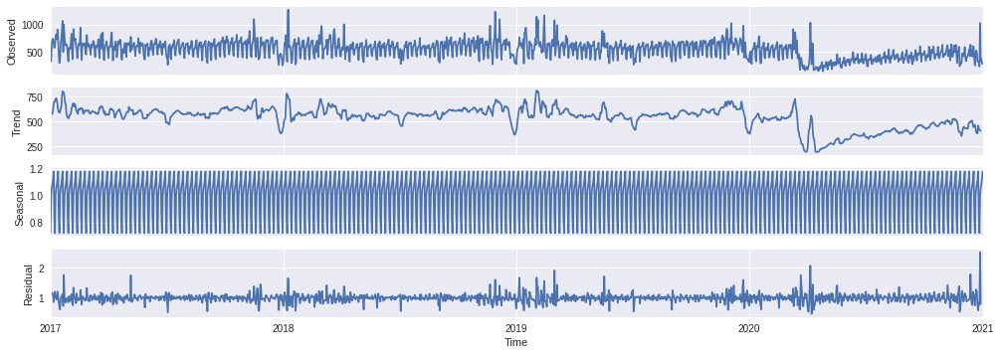

In [ ]:
#Seasonal Descomposition
accidents_incpd_ts.index = pd.to_datetime(accidents_incpd_ts.index)
#Graph
accidents_incpd_ts_re= accidents_incpd_ts.resample("1D").interpolate(method="linear")
res_mul = seasonal_decompose(accidents_incpd_ts_re["# Incidents"], model="mul")
fig=res_mul.plot()
fig.set_size_inches(15, 5)

Figure 31: This figure shows the seasonal descomposition of the total number of accidents incidents between 2017 and 2020. It ilustrates, trends, seasonality, and the residual distributions.

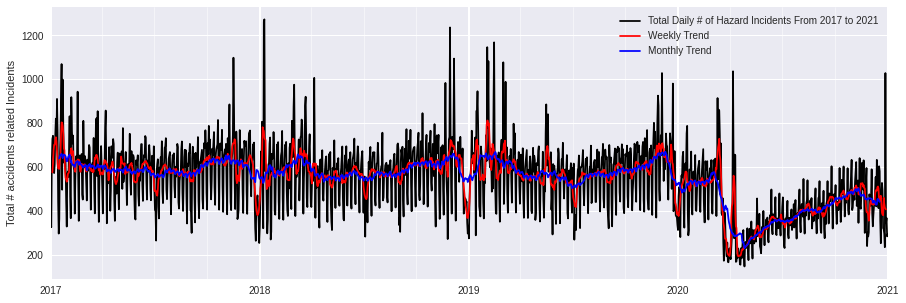

In [ ]:
#Weekly and montly trends
accidents_incpd_07 =accidents_incpd_ts_re.rolling(7, center=True).mean()
accidents_incpd_30 =accidents_incpd_ts_re.rolling(30, center=True).mean()
fig, ax = plt.subplots( figsize=(15, 5))
accidents_incpd_ts_re.plot(y="# Incidents", color="k", label="Total Daily # of Hazard Incidents From 2017 to 2021",  ax=ax)
accidents_incpd_07.plot(y="# Incidents", color="red", label="Weekly Trend",  ax=ax)
accidents_incpd_30.plot(y="# Incidents", color="blue", label="Monthly Trend",  ax=ax)
ax.grid(axis="x", which="major", lw=2)
ax.grid(axis="x", which="minor", lw=0.5)
ax.set_xlabel("")
ax.set_ylabel("Total # accidents related Incidents")
fig.show()

Figure 32: This graph shows the weekly and monthly trends of the total number of accidents incidents between 2017 and 2020. It shows the long and short term trends of this time series.

Text(0, 0.5, 'Residual # of accidents related Incidents')

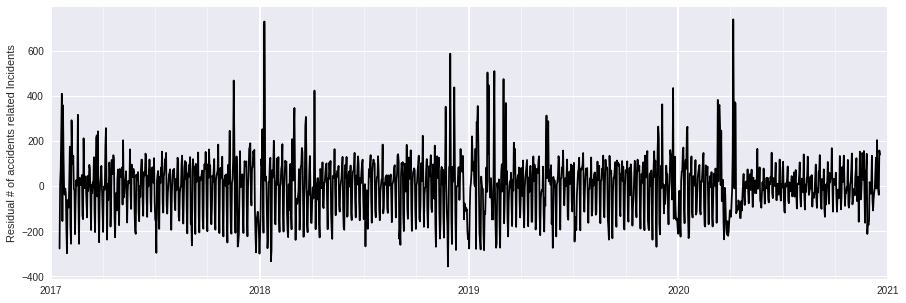

In [ ]:
#Periodicity
accidents_incpd_short = accidents_incpd_ts_re - accidents_incpd_30
ax =accidents_incpd_short.plot(y="# Incidents", color="k", legend=False, figsize=(15, 5))
ax.grid(axis="x", which="major", lw=2)
ax.grid(axis="x", which="minor", lw=0.5)
ax.set_xlabel("")
ax.set_ylabel("Residual # of accidents related Incidents")

Figure 33: This figures is a time series of the residual of the total number of accidents incidents. It ilustrates the temporal patern withpith the long term trends.

(1.0, 28.0)

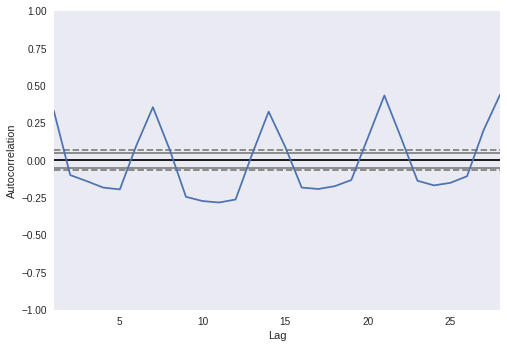

In [ ]:
#autocorrelation plot 
ax=pd.plotting.autocorrelation_plot(accidents_incpd_short["# Incidents"].dropna())
ax.set_xlim(1,28)

Figure 34: This is the autocorrelation plot of the total number of accidents incidentes. It ilustartes the structure of the data, according to this graph there is weekly seasonality in this timeseries because there is a peak every 7 lags.

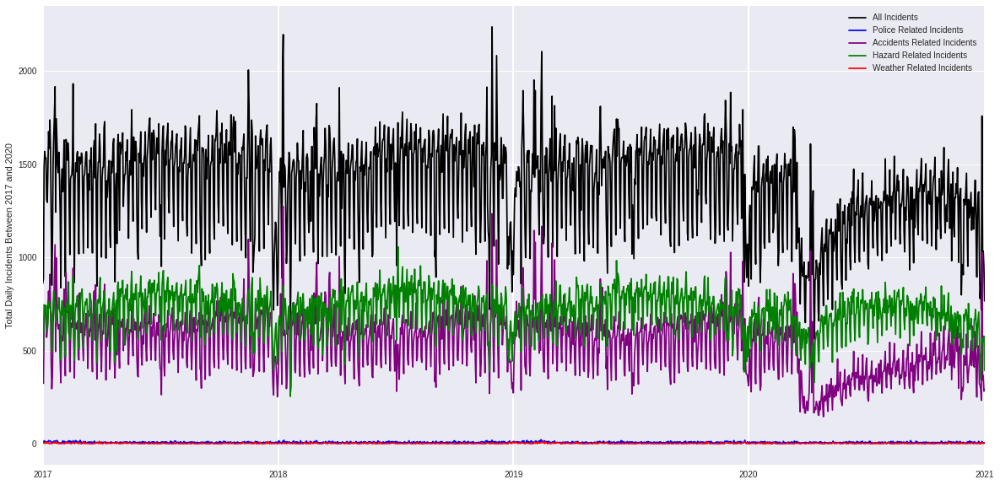

In [ ]:
#Plot all timeserias 
fig = plt.figure(figsize=(20,10))
ax = plt.subplot(111)
incpd_ts["# Incidents"].plot(ax=ax, color="k")
police_incpd_ts["# Incidents"].plot(ax=ax,color="blue")
accidents_incpd_ts["# Incidents"].plot(ax=ax,color="purple")
hazard_incpd_ts["# Incidents"].plot(ax=ax,color="g")
weather_incpd_ts["# Incidents"].plot(ax=ax,color="r")
ax.grid(axis="x", which="major", lw=2)
ax.set_xlabel("")
ax.set_ylabel("Total Daily Incidents Between 2017 and 2020")
ax.legend(["All Incidents","Police Related Incidents","Accidents Related Incidents", "Hazard Related Incidents", "Weather Related Incidents"])
fig.show()

Figure 35: Time series of the number of incidents due to weather, police, hazard, and accidents between 2017 and 2020 in some counties of the state of California. It shows the temporal distribution of the number of weather, police, hazard, and accidents  incidents.

In [ ]:
#Incorporating all time series to the same dataframe
incpd_T=incpd
incpd_T["# W Incidents"]=weather_incpd["# Incidents"]
incpd_T["# H Incidents"]=hazard_incpd["# Incidents"]
incpd_T["# A Incidents"]=accidents_incpd["# Incidents"]
incpd_T["# P Incidents"]=police_incpd["# Incidents"]
incpd_T=incpd_T.dropna()

### **Interactive Visualizations**

In [ ]:
#SET BOKEH TO DISPLAY IN THE NOTEKOOK
output_notebook()

In [ ]:
# CREATE A NEW PLOT
bfig = bp.figure(x_axis_type="datetime", y_axis_label="Total daily incidents", width=1000, height=400)
bfig.line("Time", "# Incidents", source=incpd_ts)
bp.show(bfig)

Figure 36: Interactive timeseries visualization. It can be used to explore the data, it is posible to sume the graph and identify the number of incidents at a selected day easly. 

In [ ]:
inc1720_total=incpd_ts["# Incidents"].sum()
Winc1720_total=weather_incpd_ts["# Incidents"].sum()
Pinc1720_total=police_incpd_ts["# Incidents"].sum()
Hinc1720_total=hazard_incpd_ts["# Incidents"].sum()
Ainc1720_total=accidents_incpd_ts["# Incidents"].sum()

In [ ]:
dinc1720_type = [['Total', inc1720_total], ['Weather',Winc1720_total], ['Police', Pinc1720_total], ["Hazard", Hinc1720_total], ["Accidents", Ainc1720_total]]
  
# Create the pandas DataFrame
inc1720_type = pd.DataFrame(dinc1720_type, columns = ['Type of Incidents', '# Incidents'])
  
# print dataframe.
inc1720_type

,Type of Incidents,# Incidents
0,Total,2023216
1,Weather,4024
2,Police,11852
3,Hazard,1047162
4,Accidents,796656


In [ ]:
inc1720_type["# Incidents log"]=np.log10(inc1720_type["# Incidents"])

In [ ]:
inc1720_type

,Type of Incidents,# Incidents,# Incidents log
0,Total,2023216,6.306042
1,Weather,4024,3.604658
2,Police,11852,4.073792
3,Hazard,1047162,6.020014
4,Accidents,796656,5.901271


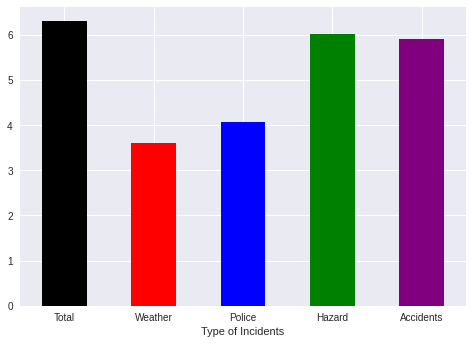

In [ ]:
inc1720_type.plot.bar(x='Type of Incidents', y='# Incidents log', color=["k","r","b", "green", "purple"], rot=0, legend=False)

Figure 37: Bar plot with the total values of logarithmic incidents by type of incident. It shows the difference between each type of incident. 

In [ ]:
#INteractive bar plot
fig = px.bar(inc1720_type, x="Type of Incidents", y="# Incidents log", text="# Incidents log")
fig.update_traces(marker_color=["black","red","blue", "green", "purple"])
fig.update_traces(texttemplate='%{text:.3s}', textposition='outside')
fig.update_layout(uniformtext_minsize=8, uniformtext_mode='hide')
fig.show()

Figure 38: Interactive bar plot with the total values of logarithmic incidents by type of incident. It shows the difference between each type of incident. 

# **Dasboard**

In [ ]:
#Groupby County
avdC17_County=avdC17.groupby("County").sum().reset_index()

In [ ]:
#Drop duplicate values per County
ccshps_C=ccshps.drop_duplicates(subset=["COUNTY_ABB"])

In [ ]:
#Merge dataframe and geodataframe
avdC17_geo_County=ccshps_C.merge(avdC17_County, left_on="COUNTY_ABB", right_on="County")

In [ ]:
#  convert to "epsg:4326"
avdC17_geo_County = avdC17_geo_County.to_crs("EPSG:4326")

In [ ]:
#Incorporate all types of incidents
avdC17_geo_County["# W Incidents"]=weather_incpd["# Incidents"]
avdC17_geo_County["# H Incidents"]=hazard_incpd["# Incidents"]
avdC17_geo_County["# A Incidents"]=accidents_incpd["# Incidents"]
avdC17_geo_County["# P Incidents"]=police_incpd["# Incidents"]

In [ ]:
#Create a choropleth of the number of incidents
fig = px.choropleth_mapbox(avdC17_geo_County,
                           geojson=avdC17_geo_County.set_index("COUNTY_ABB"),
                           locations="COUNTY_ABB", color="# Incidents",
                           color_continuous_scale="Viridis",
                           mapbox_style="open-street-map",
                           center={"lat": 37.5517, "lon": -120.7073},
                           zoom=4.5)
fig.show()

Figure 39: Choroplot of the number incidents by country. It helps to localizate geographically the counties with high and low number of incidents.

In [ ]:
# An interactive line plot
fig=px.line(incpd_T, x="Time", y="# Incidents", title="All road incidents from 2017 to 2020")
fig.update_traces(line_color="black", line_width=1)
fig.update_layout(plot_bgcolor="whitesmoke")
fig.show()

Figure 40: Interactive timeseries with the number of incidents by country. It helps to localizate geographically the counties with high and low number of incidents. 

In [ ]:
# Make a dashboard

app = JupyterDash(__name__)
app.layout=html.Div([
                     html.H1("State of California Traffic Incidents"),
                     html.P("Total number of Incidents, including Weather, Hazard, Police, Accindents and also closure, Advisory and Breakdown related incidents that produced traffic delays in some counties of the state of California between 2017 and 2020."),
                     html.Div([
                               dcc.RadioItems(id="Type of incident", options=[dict(label="Incidents", value= "# Incidents"),
                                                                              dict(label="Weather Incidents", value= "# W Incidents"),
                                                                              dict(label="Hazard Incidents", value= "# H Incidents"),
                                                                              dict(label="Police Incidents", value= "# P Incidents"),
                                                                              dict(label="Accidents Incidents", value= "# A Incidents")],
                                              value="# Incidents"),
                               dcc.Graph(id="choropleth")                               
                     ],style=dict(width="49%", display="inline-block")),
                     html.Div([
                               dcc.Graph(id="timeseries")
                     ],style=dict(width="49%", display="inline-block", float="right"))
                     ])

@app.callback(Output("choropleth", "figure"),[Input("Type of incident", "value")])
def display_choropleth(wtype):
  fig = px.choropleth_mapbox(avdC17_geo_County,
                             geojson=avdC17_geo_County.set_index("COUNTY_ABB"),
                             locations="COUNTY_ABB", color=wtype,
                             opacity=0.8,
                             color_continuous_scale="Viridis",
                             mapbox_style="open-street-map",
                             center={"lat": 37.5517, "lon": -120.7073},
                             zoom=4)
  fig.update_layout(margin=dict(r=0, t=40, l=0, b=0))
  
  return fig

@app.callback(Output("timeseries", "figure"),[Input("Type of incident", "value")])
def update_timeseries(wtype):

  fig=px.line(incpd_T, x="Time", y=wtype, title="All road incidents from 2017 to 2020")
  fig.update_traces(line_color="black", line_width=1)
  fig.update_layout(plot_bgcolor="whitesmoke")

  return fig

app.run_server("inline")

<IPython.core.display.Javascript object>

# **Results**

*Descriptive statistics* 

As in 2017, in the state of California, there were 	9.234690e+05 hours of traffic delay per county. In turn, there were 3146.806250	on average incidents per county. Thus, the average number of incidents per day in each county was 8.621375. 

*Linear Regression*

According to the data analyzed there is a relationship between the number of road incidents and the hours of traffic delay in some counties within the state of California, S= 0.9547 R= 0.497. Since this regression is a log-log analysis, it means that on percent change in the number of incidents, leads to a 0.9547 percent change in the hours of traffic delay.  In this sense, four 4 major types of traffic delay in the counties that reported the data seem to contribute to traffic jams: 

*   Police incidents with a total of 11852 during 2017
*   Hazard incidents With a total of 1047162 during 2017
*   Weather incidents With a total of 4024 during 2017
*   Accidents incidents With a total of 796656 during 2017

Here, it seems that road hazards and accidents are the main cause of high traffic hour delays. It would be great to run a multiple linear regression (MLR), to predict more precisely which of these variables produces a major change in the outcome of the response variable, hours delay.

*Time-series Analysis*

The time-series analysis showed that there are seasonal patterns in the traffic incidents time-series. There is weekly periodicity and the days with the higher number of incidents are Fridays. 

*Geospatial Analysis*
The geospatial distribution of the number of incidents and the hours of delay are correlated, there are similar patterns in these two graphs. On the other hand, The graph of the number of incidents per day illustrates what are the counties that present a higher rate of incidents, and shows what are the areas in which the state government needs to work. 

# **Policy Recomendations**
Following the evidence presented by the data, various policy recommendations can be provided.

1- Improve the systems of traffic data collection in the state of California, since only 2/3 of the total number of counties reported data. 

2- Design seasonal policies to target seasonal traffic jams. Since the data illustrates that there is seasonality, policymakers need to develop more accurate policy that follows these patterns. For instance, there could be established seasonal tolls, on various roads, depending on the day of the week and the month of the year. 

3- Craft policies to decrease the number of Accidents since that is the principal factor in the increase of hours of delay. Other incidents such as hazards, and police incidents need to be addressed as well. Finally, there is a need to create an action plant to minimize the number of incidents due to weather conditions. Policy targeting strategic planning in public organizations could help in this sense. 